In [173]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


In [174]:
# house_price  = pd.read_csv('./housePractice.csv')
house_price = pd.read_csv('./housePractice.csv', error_bad_lines=False)

house_price.head(5)


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [175]:
house_price.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [176]:
house_price.shape

(21613, 21)

In [177]:
house_price.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [178]:
house_price['date'] =  pd.to_datetime(house_price['date'],format= '%Y-%m-%d')


In [179]:
house_price.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  float64       
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         
 12  sqft_above     21613 non-null  int64         
 13  sqft_basement  21613 non-null  int64         
 14  yr_built       21613 non-null  int64         
 15  yr_renovated   2161

In [237]:
X = house_price['sqft_living'].values
y = house_price['price']


In [238]:
X = X.reshape(-1,1)
X

array([[5650],
       [7639],
       [8062],
       ...,
       [2007],
       [1287],
       [1357]])

In [239]:
x_train, x_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2 ,random_state=100)


In [240]:
x_train.shape

(17290, 1)

In [241]:
x_test.shape

(4323, 1)

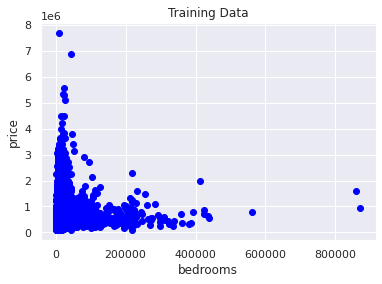

In [242]:
plt.scatter(x_train, y_train, color='blue')
plt.xlabel('bedrooms')
plt.ylabel('price')
plt.title('Training Data')
plt.show()


In [243]:
model = LinearRegression()
model.fit(x_train, y_train)


LinearRegression()

In [246]:
y_predict = model.predict(x_test)


In [247]:
y_test

19836    285000.0
10442    239950.0
20548    460000.0
11014    397500.0
4138     545000.0
           ...   
5625     235000.0
8698     500000.0
9786     850000.0
2784     340000.0
9552     788000.0
Name: price, Length: 4323, dtype: float64

In [248]:
y_predict

array([531322.8851347 , 538921.32991488, 571429.44155902, ...,
       538326.48707017, 533899.5410751 , 537376.93056931])

In [249]:
New_house_with_bedrooms = np.array([3]).reshape(-1,1)
New_house_with_bedrooms

array([[3]])

In [250]:
model.predict(New_house_with_bedrooms)

array([526728.54617831])

In [251]:
model.score(x_train, y_train)*100


0.5786379827975474

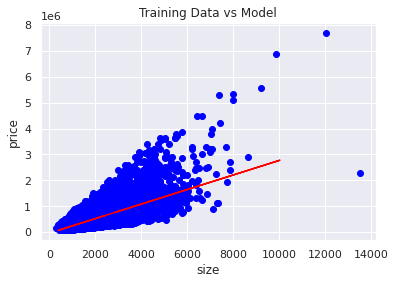

In [193]:
plt.scatter(x_train, y_train, color='blue')
plt.plot(x_test, y_predict, color='red')
plt.xlabel('size')
plt.ylabel('price')
plt.title('Training Data vs Model')
plt.show()


In [194]:
## do 

In [195]:
house_price.head(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [196]:
import seaborn as sns
sns.set()


 # conclusions 2

In [202]:
X = house_price['sqft_living'].values
y = house_price['price']
X = X.reshape(-1,1)
x_train, x_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2 ,random_state=100)


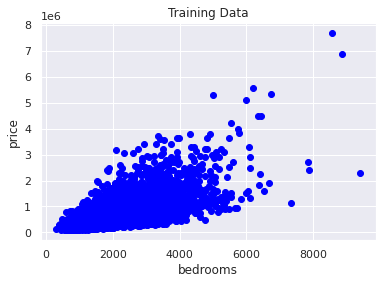

In [203]:
plt.scatter(x_train, y_train, color='blue')
plt.xlabel('bedrooms')
plt.ylabel('price')
plt.title('Training Data')
plt.show()


In [204]:
model = LinearRegression()
model.fit(x_train, y_train)



31.398314087461

In [205]:
y_predict = model.predict(x_test)
model.score(x_train, y_train)*100


33.19441911885232

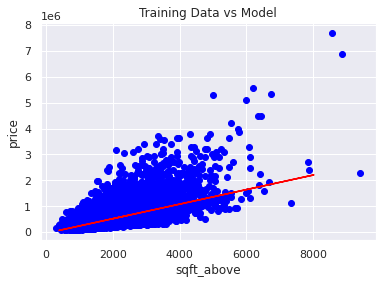

In [207]:
plt.scatter(x_train, y_train, color='blue')
plt.plot(x_test, y_predict, color='red')
plt.xlabel('sqft_above')
plt.ylabel('price')
plt.title('Training Data vs Model')
plt.show()


 # conclusions 3

In [234]:
X = house_price['sqft_lot15'].values
y = house_price['price'].values
X = X.reshape(-1,1) 
x_train, x_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2 ,random_state=100)


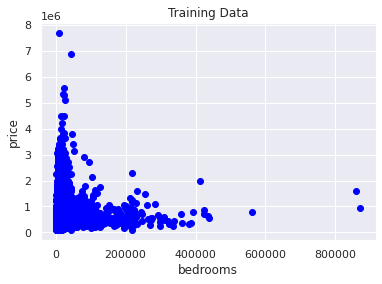

In [235]:
plt.scatter(x_train, y_train, color='blue')
plt.xlabel('bedrooms')
plt.ylabel('price')
plt.title('Training Data')
plt.show()


In [236]:
model.score(x_train, y_train)*100


-52375.23108752785

In [233]:
y_predict = model.predict(x_test)
model.score(x_test, y_test)*100


-253.0376630063841